In [1]:
! pwd

/Users/lsb/jupyterlab


In [2]:
import torch

torch.num_threads=64

import numpy as np
from PIL import Image, ImageDraw, ImageFont, ImageOps, ImageEnhance, ImageFilter
from datetime import datetime, timedelta
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, AutoencoderTiny
from diffusers.models.attention_processor import SlicedAttnProcessor
from tqdm import tqdm
from pathlib import Path

#atkbold = ImageFont.truetype("Atkinson-Hyperlegible-Bold-102.otf", 380)
atkbold = ImageFont.truetype("OCRB.ttf", 350)
#atkbold_smol = ImageFont.truetype("Atkinson-Hyperlegible-Bold-102.otf", 40)

image_size = (1600, 900)
screen_size = image_size

def mask_image(timestamp, mask_text=None):
    if mask_text is None:
        mask_text = timestamp.strftime(f"%H\u2009%M\u2009%S")
    #mask_text = timestamp.strftime(f"%H\u2009%M")
    time_img = Image.new("L", image_size, (0,))
    draw = ImageDraw.Draw(time_img)
    draw.multiline_text(
        xy=(-30,120),
        text=mask_text,
        fill=(255,),
        font=atkbold,
        align="center",
        spacing=-50,
    )
    # return time_img
    (i_left, i_top, i_right, i_bottom) = time_img.getbbox()
    # pad the image horizonally to the full size
    i_left = 0
    i_right = image_size[0]
    time_img = time_img.crop((i_left, i_top, i_right, i_bottom))
    return ImageOps.pad(time_img, image_size)

preferred_dtype = torch.float32
preferred_device = "cuda" if torch.cuda.is_available() else ("mps" if torch.backends.mps.is_available() else "cpu")
preferred_device = "cpu"


/Users/lsb/jupyterlab/.direnv/python-3.11/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


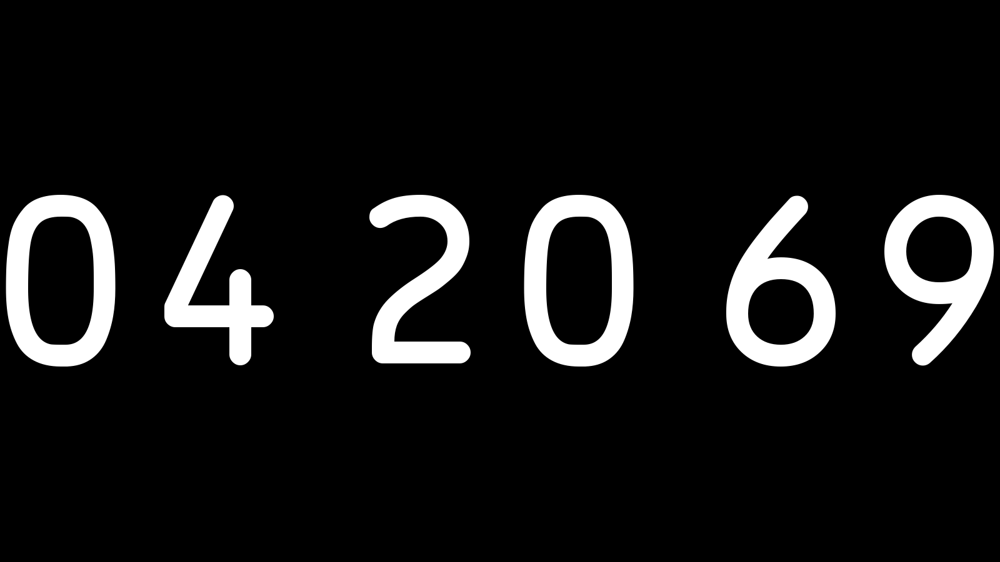

In [3]:
m42069 = mask_image(None, mask_text="04\u200920\u200969")
m42069

In [4]:
cali4 = "nighttime photo of a desert landscape with the milky way in the sky and boulders on a shallow lake bed surrounded by tall mountains"
negative_prompt = "low quality, ugly, wrong"

/Users/lsb/jupyterlab/.direnv/python-3.11/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading pipeline components...: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 24.90it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circ

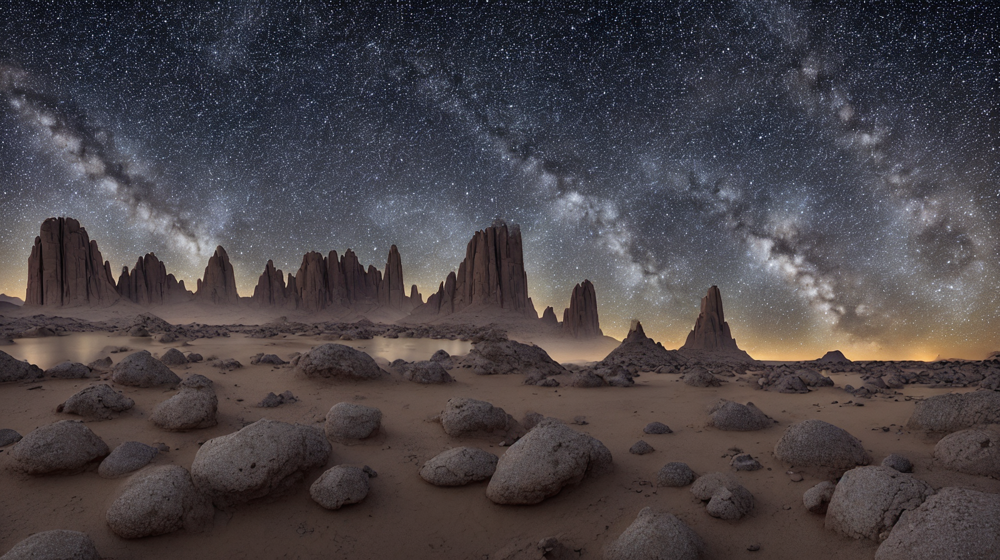

In [5]:
controlnet = ControlNetModel.from_pretrained(
    "monster-labs/control_v1p_sd15_qrcode_monster",
    subfolder="v2",
    torch_dtype=preferred_dtype,
).to(preferred_device)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "SimianLuo/LCM_Dreamshaper_v7",
    controlnet=controlnet,
    torch_dtype=preferred_dtype,
    safety_checker=None,
).to(preferred_device)

img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=m42069,
    num_inference_steps=4,
    guidance_scale=7.0,
    controlnet_conditioning_scale=0.5,
    generator=torch.manual_seed(42069),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:43<00:00, 11.00s/it]


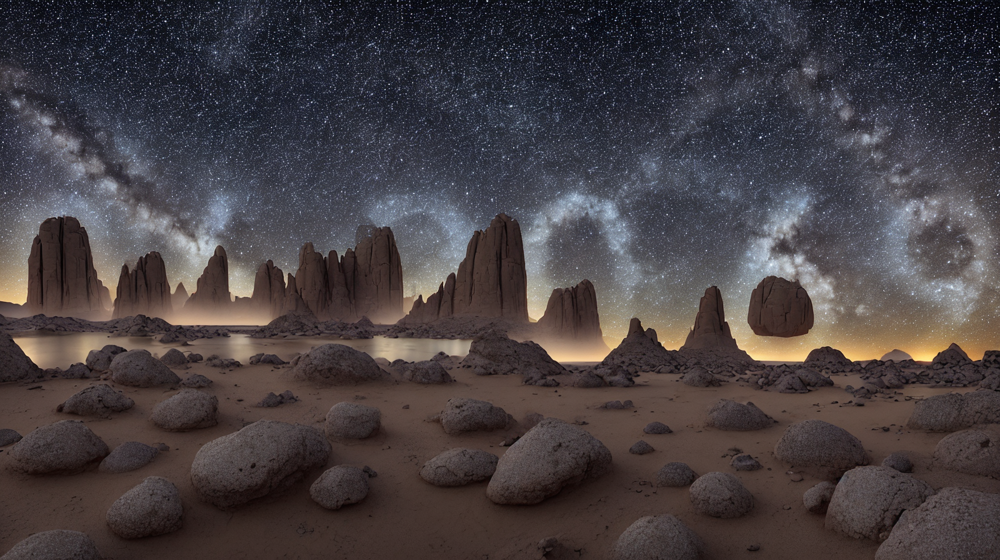

In [6]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=m42069,
    num_inference_steps=4,
    guidance_scale=7.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42069),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [7]:
from diffusers import AutoencoderKL

controlnet = ControlNetModel.from_pretrained(
    "IDKiro/sdxs-512-dreamshaper-sketch",
    torch_dtype=preferred_dtype,
).to(preferred_device)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "IDKiro/sdxs-512-dreamshaper",
    controlnet=controlnet,
    torch_dtype=preferred_dtype,
    safety_checker=None,
    #vae=AutoencoderKL.from_pretrained("IDKiro/sdxs-512-dreamshaper", subfolder="vae_large"),
).to(preferred_device)

Loading pipeline components...:  33%|█████████████████████████████████████████████████████████                                                                                                                  | 2/6 [00:00<00:00, 13.15it/s]/Users/lsb/jupyterlab/.direnv/python-3.11/lib/python3.11/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
The config attributes {'block_out_channels': [64, 64, 64, 64], 'sample_size': 512} were passed to AutoencoderTiny, but are not expected and will be ignored. Please verify your config.json configuration file.
Loading pipeline components...: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 24.10it/s]
You have disabled the 

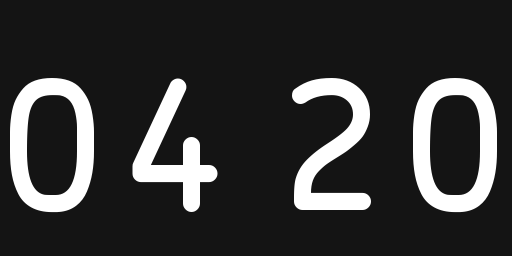

In [69]:
image_size = (512, 256)
ocrb100 = ImageFont.truetype("OCRB.ttf", 170)
def smol_mask_image(timestamp, mask_text=None):
    if mask_text is None:
        mask_text = timestamp.strftime(f"%H\u2009%M\u2009%S")
    time_img = Image.new("L", image_size, (20,))
    draw = ImageDraw.Draw(time_img)
    draw.multiline_text(
        xy=(-10,50),
        text=mask_text,
        fill=(255,),
        font=ocrb100,
        align="center",
        spacing=-50,
    )
    return time_img

smol_mask_image(None, mask_text="04\u200920")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.63it/s]


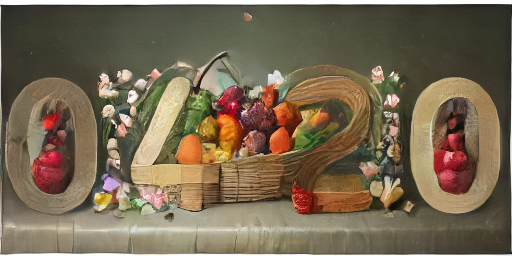

In [70]:
img = pipe(
    prompt="still life of flowers and a basket of fruit",
    negative_prompt=negative_prompt,
    image=smol_mask_image(None, mask_text="04\u200920").filter(ImageFilter.GaussianBlur(0)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [71]:
from skimage import feature

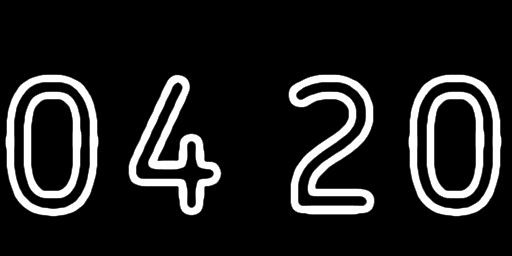

In [72]:
ImageEnhance.Contrast(Image.fromarray(feature.canny(np.array(smol_mask_image(None, mask_text="04\u200920")))).convert("L").filter(ImageFilter.GaussianBlur(2))).enhance(20.0)

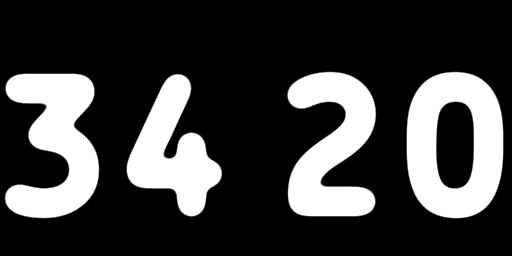

In [74]:
b420 = ImageEnhance.Contrast(smol_mask_image(None, mask_text="34\u200920").filter(ImageFilter.GaussianBlur(6))).enhance(20.0)
b420

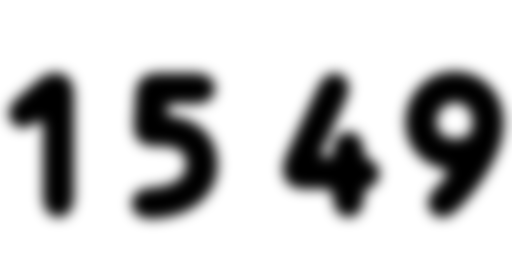

In [76]:

def m_mask_image(self, timestamp):
    from PIL import Image
    #mask_text = timestamp.strftime(f"%H\u2009%M\u2009%S")
    mask_text = timestamp.strftime(f"%H\u2009%M")
    time_img = Image.new("L", image_size, (255,))
    draw = ImageDraw.Draw(time_img)
    draw.multiline_text(
        # xy=(-30,120),
        xy=(-10, 50),
        text=mask_text,
        fill=(0,),
        font=ocrb100,
        align="center",
        spacing=-10,
    )
    ballooned = ImageEnhance.Contrast(time_img.filter(ImageFilter.GaussianBlur(6))).enhance(50.0)
    return ballooned.filter(ImageFilter.GaussianBlur(6))

m_mask_image(None, datetime.now())

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.72it/s]


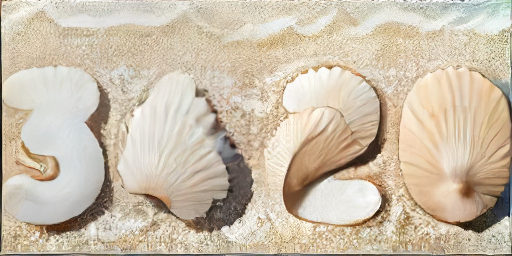

In [77]:
img = pipe(
    prompt="seashells on a beach",
    negative_prompt=negative_prompt,
    image=b420,
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.77it/s]


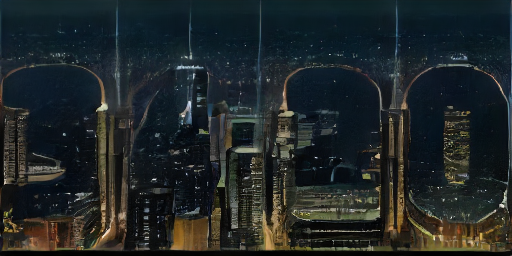

In [80]:
img = pipe(
    prompt="skyscrapers in a city at night",
    negative_prompt=negative_prompt,
    image=b420,
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.68it/s]


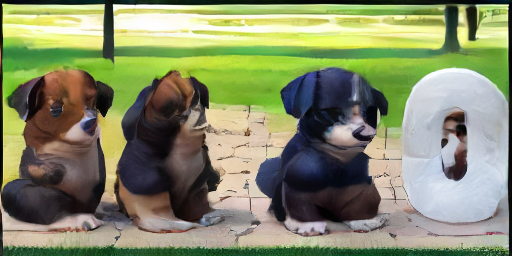

In [81]:
img = pipe(
    prompt="puppies in the park",
    negative_prompt=negative_prompt,
    image=b420,
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.77it/s]


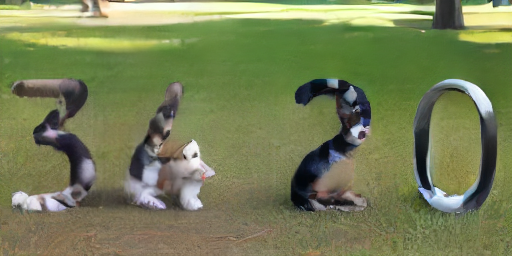

In [82]:
img = pipe(
    prompt="puppies in the park",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.80it/s]


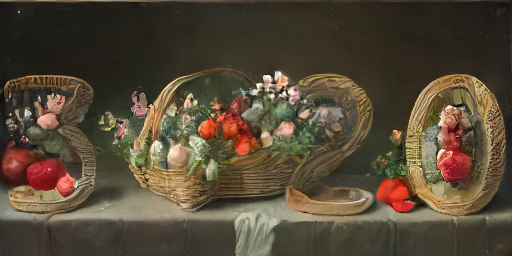

In [83]:
img = pipe(
    prompt="still life with flowers and a basket of fruit",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.73it/s]


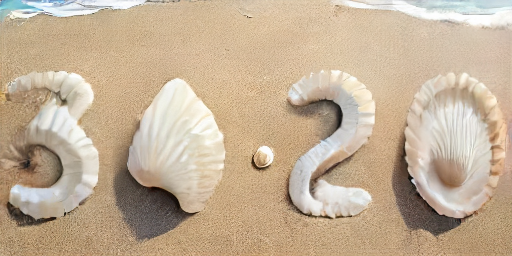

In [84]:
img = pipe(
    prompt="seashells on the beach",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.73it/s]


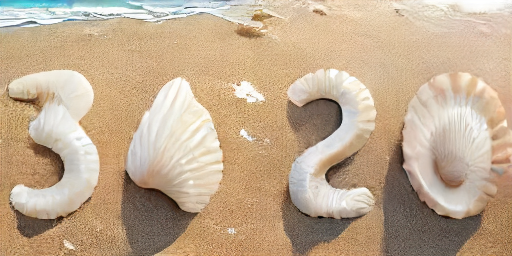

In [85]:
img = pipe(
    prompt="seashells on the beach",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [86]:
cali4

'nighttime photo of a desert landscape with the milky way in the sky and boulders on a shallow lake bed surrounded by tall mountains'

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.74it/s]


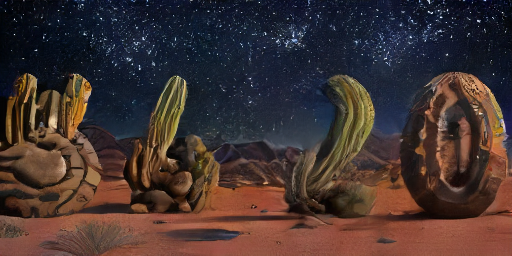

In [87]:
img = pipe(
    prompt="nighttime photo of a desert landscape of cacti and large boulders and small boulders with the milky way in the sky surrounded by tall mountains",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.74it/s]


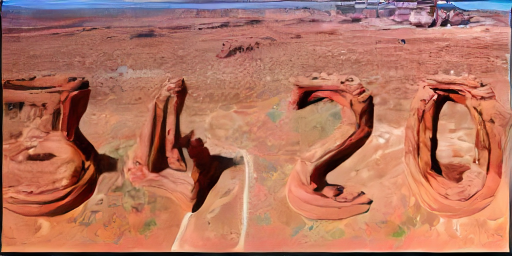

In [88]:
img = pipe(
    prompt="aerial photo of arches and mesas and buttes in the desert",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.71it/s]


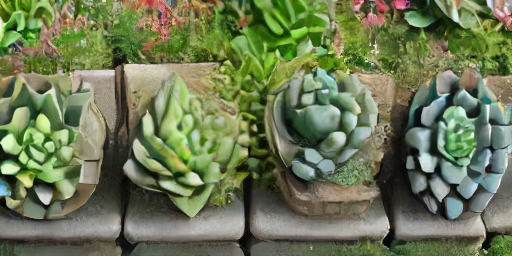

In [89]:
img = pipe(
    prompt="beautiful arrangement of succulents in a planter in a garden",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(8)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.69it/s]


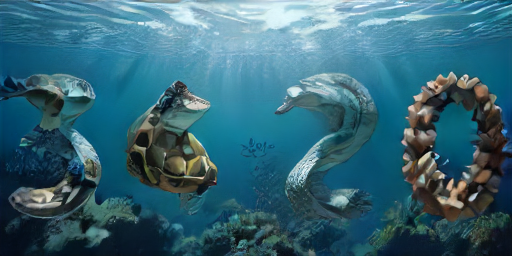

In [90]:
img = pipe(
    prompt="turtles and sharks and sea anemones and other fish in the ocean",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.70it/s]


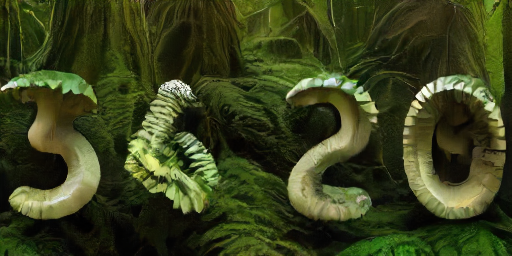

In [91]:
img = pipe(
    prompt="ferns and mushrooms in a redwood forest",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.60it/s]


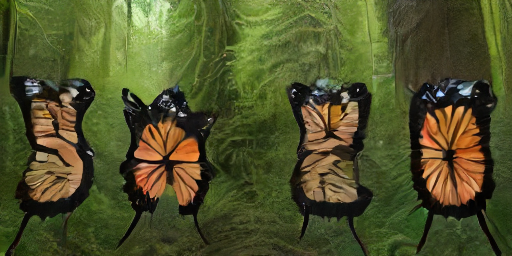

In [92]:
img = pipe(
    prompt="a family of butterflies in a redwood forest",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(5)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="large boulders and shrubs in the forest by a lake",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="ladybugs crawling on flowers",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="puppies in the park",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="pillars in the ocean and dolphins jumping up and surfers and seafoam at golden hour",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.5,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="cyberpunk city at night with neon lights and flying cars",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="colored pencil drawing of bees on flowers",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.8,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="underwater photo of kelp and starfish and sea anemones and turtles and small fish and sponges and coral",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="ferns on a trail in an old redwood forest",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="photo of crows on tree branches by a trail in an old redwood forest",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="photo of colorful hummingbirds on tree branches by a trail in an old redwood forest",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="photo of pressed flowers",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="photo of cinnamon sticks and cardamom pods and cloves and peppercorns and star anise on a marble countertop",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="cars and shops in a cyberpunk city at night",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="engraving print of brightly colored mushrooms",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="aerial photo of lakes in the desert",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(b420).filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.4,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=m42069,
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42069),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=m42069,
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.5,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
    
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=m42069,
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(420),
    height=image_size[1] // 2,
    width=image_size[0] // 2,
    
).images[0]
img

In [ ]:
# use PIL to invert the mask image
i_m42069 = ImageOps.invert(m42069)

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=i_m42069,
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42069),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=m42069.filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.8,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="wildflowers in a meadow at sunrise",
    negative_prompt=negative_prompt,
    image=m42069.filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.8,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="boulders in the desert lake at sunrise with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=i_m42069.filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.5,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="boulders in the desert lake at sunrise with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=i_m42069.filter(ImageFilter.GaussianBlur(10)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="boulders in the desert lake at midnight with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=m42069.filter(ImageFilter.GaussianBlur(8)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.75,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
ocrb_large = ImageFont.truetype("OCRB.ttf", 525)
#atkbold_smol = ImageFont.truetype("Atkinson-Hyperlegible-Bold-102.otf", 40)

image_size = (1600, 900)
screen_size = image_size

def large_mask_image(timestamp, mask_text=None):
    if mask_text is None:
        mask_text = timestamp.strftime(f"%H\u2009%M\u2009%S")
    #mask_text = timestamp.strftime(f"%H\u2009%M")
    time_img = Image.new("L", image_size, (0,))
    draw = ImageDraw.Draw(time_img)
    draw.multiline_text(
        xy=(0,250),
        text=mask_text,
        fill=(255,),
        font=ocrb_large,
        align="center",
        spacing=-10,
    )
    return time_img
    (i_left, i_top, i_right, i_bottom) = time_img.getbbox()
    # pad the image horizonally to the full size
    i_left = 0
    i_right = image_size[0]
    time_img = time_img.crop((i_left, i_top, i_right, i_bottom))
    return ImageOps.pad(time_img, image_size)

large_mask_image(None, mask_text="04\u200920")

In [ ]:
img = pipe(
    prompt="high quality night time photo of a desert sunrise with the sun on the horizon and large boulders on a shallow lake bed surrounded by cactus and tall mountains",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(15))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="high quality night time photo of a desert sunrise with the sun on the horizon and large boulders on a shallow lake bed surrounded by cactus and tall mountains",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(22))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(420),
    height=image_size[1] // 2,
    width=image_size[0] // 2,
).images[0]
img

In [ ]:
img = pipe(
    prompt="high quality night time photo of a desert sunrise with the sun on the horizon and large boulders on a shallow lake bed surrounded by cactus and tall mountains",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(14))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(420),
    height=432,
    width=768,
).images[0]
img

In [ ]:
img = pipe(
    prompt="high quality night time photo of a desert sunrise with the sun on the horizon and small boulders and large boulders on a shallow lake bed surrounded by boulders and tall mountains",
    negative_prompt=negative_prompt,
    image=ImageOps.invert(large_mask_image(timestamp=None,mask_text="23\u200955").filter(ImageFilter.GaussianBlur(16))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42),
    height=432,
    width=768,
).images[0]
img

In [ ]:
img = pipe(
    prompt="high quality night time photo of a desert sunrise with the sun on the horizon and small boulders and large boulders on a shallow lake bed surrounded by boulders and grasses and cactus and tall mountains",
    negative_prompt=negative_prompt,
    image=(large_mask_image(timestamp=None,mask_text="08\u200957").filter(ImageFilter.GaussianBlur(12))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42),
    height=288,
    width=512,
).images[0]
img

In [ ]:
large_mask_image(timestamp=None,mask_text="23\u200952").filter(ImageFilter.GaussianBlur(12)).resize((512,288))

In [ ]:
large_mask_image(timestamp=None,mask_text="23\u200952").resize((512,288)).filter(ImageFilter.GaussianBlur(4))

In [ ]:
ocrb_large = ImageFont.truetype("OCRB.ttf", 525)
#atkbold_smol = ImageFont.truetype("Atkinson-Hyperlegible-Bold-102.otf", 40)

image_size = (1600, 900)
screen_size = image_size

def large_mask_image(timestamp, mask_text=None):
    if mask_text is None:
        mask_text = timestamp.strftime(f"%H\u2009%M\u2009%S")
    #mask_text = timestamp.strftime(f"%H\u2009%M")
    time_img = Image.new("L", image_size, (0,))
    draw = ImageDraw.Draw(time_img)
    draw.multiline_text(
        xy=(0,250),
        text=mask_text,
        fill=(255,),
        font=ocrb_large,
        align="center",
        spacing=-10,
    )
    return time_img
    (i_left, i_top, i_right, i_bottom) = time_img.getbbox()
    # pad the image horizonally to the full size
    i_left = 0
    i_right = image_size[0]
    time_img = time_img.crop((i_left, i_top, i_right, i_bottom))
    return ImageOps.pad(time_img, image_size)

large_mask_image(None, mask_text="04\u200920")

In [ ]:
img = pipe(
    prompt="boulders in the desert lake at midnight with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="desert lake at midnight with stars in the sky and large boulders and small boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=( large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(7))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="award winning photograph, desert lake at midnight, stars in the sky, large boulders, gravel, mountains, cacti and creosote bushes and  joshua trees",
    negative_prompt=negative_prompt,
    image=ImageOps.invert( large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(7))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="award winning photograph, desert lake at midnight, stars in the sky, large boulders, gravel, mountains, cacti and creosote bushes and  joshua trees",
    negative_prompt=negative_prompt,
    image=( large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(7))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="award winning photograph, boulders in a desert lake at midnight, stars in the sky, large boulders, small boulders, mountains, cactus, succulent shrubs, joshua trees",
    negative_prompt=negative_prompt,
    image=ImageOps.invert( large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(7))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="award winning photograph, boulders in a desert lake at midnight, stars in the sky, large boulders, small boulders, mountains, saguaro cactus, joshua trees",
    negative_prompt=negative_prompt,
    image=( large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(7))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="award winning photograph, boulders in a desert lake at midnight with boulders, stars, mountains, saguaro cactus, joshua trees",
    negative_prompt=negative_prompt,
    image=( large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(7))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="award winning photograph, boulders in a desert lake at midnight with boulders, only under starlight, mountains, cacti",
    negative_prompt=negative_prompt,
    image=( large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(7))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="award winning photograph, boulders in a desert lake at midnight, boulders in starlight, mountains, cacti",
    negative_prompt=negative_prompt,
    image=( large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(8))),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="boulders in the desert lake at midnight with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="boulders in the desert lake at midnight with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt="boulders in the desert lake at midnight with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=1,
    guidance_scale=0.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
from diffusers import StableDiffusionXLControlNetPipeline, UNet2DConditionModel, LCMScheduler

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-zoe-depth-sdxl-1.0",
    #variant="fp16",
    torch_dtype=preferred_dtype,
).to(preferred_device)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    unet=UNet2DConditionModel.from_pretrained(
        "latent-consistency/lcm-sdxl",
        torch_dtype=preferred_dtype,
        # variant="fp16",
        ),
    vae=AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=preferred_dtype),
    #variant="fp16",
    torch_dtype=preferred_dtype,
)
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)


In [ ]:
img = pipe(
    prompt="boulders in the desert lake at midnight with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9))

In [ ]:
img = pipe(
    prompt="boulders in the desert lake at midnight with boulders and mountains and joshua trees",
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=12,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.5,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(20)),
    num_inference_steps=4,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.5,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
from diffusers import StableDiffusionXLControlNetPipeline, UNet2DConditionModel

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",
    #variant="fp16",
    torch_dtype=preferred_dtype,
).to(preferred_device)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    # unet=UNet2DConditionModel.from_pretrained(
    #     "latent-consistency/lcm-sdxl",
    #     torch_dtype=preferred_dtype,
    #     # variant="fp16",
    #     ),
    # vae=AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=preferred_dtype),
    #variant="fp16",
    torch_dtype=preferred_dtype,
)



In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
from diffusers import StableDiffusionXLControlNetPipeline, UNet2DConditionModel

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-zoe-depth-sdxl-1.0",
    #variant="fp16",
    torch_dtype=preferred_dtype,
).to(preferred_device)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    #variant="fp16",
    torch_dtype=preferred_dtype,
)



In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:

from diffusers import AutoencoderKL

controlnet = ControlNetModel.from_pretrained(
    "monster-labs/control_v1p_sdxl_qrcode_monster",
    #variant="fp16",
    torch_dtype=preferred_dtype,
).to(preferred_device)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    unet=UNet2DConditionModel.from_pretrained(
        "latent-consistency/lcm-sdxl",
        torch_dtype=preferred_dtype,
        # variant="fp16",
        ),
    vae=AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=preferred_dtype),
    #variant="fp16",
    torch_dtype=preferred_dtype,
)
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)


In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.5,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.8,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=2,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=8,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
controlnet = ControlNetModel.from_pretrained(
    "monster-labs/control_v1p_sdxl_qrcode_monster",
    #variant="fp16",
    torch_dtype=preferred_dtype,
).to(preferred_device)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    # unet=UNet2DConditionModel.from_pretrained(
    #     "latent-consistency/lcm-sdxl",
    #     torch_dtype=preferred_dtype,
    #     # variant="fp16",
    #     ),
    # vae=AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=preferred_dtype),
    #variant="fp16",
    torch_dtype=preferred_dtype,
)
# pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)


In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
from diffusers import StableDiffusionXLPipeline, UNet2DConditionModel, EulerDiscreteScheduler
from huggingface_hub import hf_hub_download
from safetensors.torch import load_file

base = "stabilityai/stable-diffusion-xl-base-1.0"
repo = "ByteDance/SDXL-Lightning"
ckpt = "sdxl_lightning_4step_unet.safetensors" 

unet = UNet2DConditionModel.from_config(base, subfolder="unet").to(preferred_device, preferred_dtype)
unet.load_state_dict(load_file(hf_hub_download(repo, ckpt), device=preferred_device))
pipe = StableDiffusionXLPipeline.from_pretrained(base, unet=unet, torch_dtype=preferred_dtype).to(preferred_device) #, variant="fp16").to("cuda")

# Ensure sampler uses "trailing" timesteps.
pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")


In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=0,
    controlnet_conditioning_scale=0.1,
    generator=torch.manual_seed(42),
    height=image_size[1] // 8 * 8,
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=4,
    guidance_scale=0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1] // 8 * 8,
    width=image_size[0],
).images[0]
img

In [ ]:
controlnet = ControlNetModel.from_pretrained(
    "monster-labs/control_v1p_sdxl_qrcode_monster",
    #variant="fp16",
    torch_dtype=preferred_dtype,
).to(preferred_device)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    # unet=UNet2DConditionModel.from_pretrained(
    #     "latent-consistency/lcm-sdxl",
    #     torch_dtype=preferred_dtype,
    #     # variant="fp16",
    #     ),
    # vae=AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=preferred_dtype),
    #variant="fp16",
    torch_dtype=preferred_dtype,
)
# pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)


In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(9)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(8)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(7)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(6)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(5)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(4)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(3)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(2)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(5)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(8)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(15))

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(15)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(11)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.6,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.7,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.8,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.85,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.85,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=mask_image(timestamp=None,mask_text="04\u200920\u200969").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(8)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.1,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(8)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(4)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(420),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=20,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
img = pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=50,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0]
img

In [ ]:
# make a 10x5 grid of images at varying guidance scales

fifty0600 = [pipe(
    prompt=cali4,
    negative_prompt=negative_prompt,
    image=large_mask_image(timestamp=None,mask_text="04\u200920").filter(ImageFilter.GaussianBlur(1)),
    num_inference_steps=50,
    guidance_scale=8.0,
    controlnet_conditioning_scale=1.0,
    generator=torch.manual_seed(42),
    height=image_size[1],
    width=image_size[0],
).images[0] for _ in range(0)]